# Assessing Charlottesville property assessments

- author: Josh Carp
- categories: [land-use]

Residential property assessments in Charlottesville [rose by 11.7% in 2022](https://dailyprogress.com/news/local/govt-and-politics/city-residential-property-values-rise-by-11-69-commercial-properties-by-2-79/article_36344b90-7fba-11ec-913f-cb2b21b8b74f.html), and [local officials](https://twitter.com/MPayneCville/status/1494502130710986754) and [residents](https://twitter.com/socialistdogmom/status/1512241540067991561) are concerned. Is this an unusual change in assessments? Which properties saw the greatest increases, and why?

We can find the relevant data at the city's [Open Data Portal](https://opendata.charlottesville.org/). For simplicity, I'm going to treat parcels as residential if they have an entry in the [residential details](https://opendata.charlottesville.org/datasets/real-estate-residential-details) table. I'm also going to look up at to 20 years of data, so I'm only including homes built after 2002.

In [1]:
#collapse-hide
# Hack: Ignore shapely/geos version mismatch warning
import warnings
warnings.simplefilter("ignore")

import altair as alt
import branca
import folium
import numpy as np
import seaborn as sns
import statsmodels.formula.api as smf
from google.cloud import bigquery

bq = bigquery.Client()

First we can look at average assessments over time:

In [2]:
#collapse-hide
raw_assessments_by_year = bq.query(
    """
    select
        assessments.taxyear,
        avg(assessments.totalvalue) as totalvalue,
        count(assessments.totalvalue) as count,
    from `cvilledata.cville_open_data.real_estate_all_assessments` assessments
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumb = residential.parcelnumb
    where assessments.taxyear >= 2002
        and residential.yearbuilt <= 2002
    group by assessments.taxyear
    order by assessments.taxyear desc
    """
).result().to_dataframe()

alt.Chart(raw_assessments_by_year).mark_bar().encode(
    y=alt.Y("totalvalue:Q"),
    x=alt.X("taxyear:N", sort="x"),
    tooltip="totalvalue:Q",
).properties(
    title="Mean assessment by year",
)

alt.Chart(...)

Assessments have grown substantially over the past 20 years, almost tripling since 2002. But this doesn't tell us whether the change in values in 2022 was typical or not. Let's look at proportion change in assessments relative to the previous year over the past 20 years:

In [3]:
#collapse-hide
assessments_by_year = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    )
    select
        assessments.taxyear,
        avg(assessments.totalvalue) as totalvalue,
        avg(assessments.totalvaluechange) as totalvaluechange,
        count(assessments.totalvalue) as count,
    from assessments
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    where assessments.taxyear >= 2002
        and residential.yearbuilt < 2002
    group by assessments.taxyear
    order by assessments.taxyear desc
    """
).result().to_dataframe()

alt.Chart(assessments_by_year).mark_bar().encode(
    y=alt.Y("totalvaluechange:Q"),
    x=alt.X("taxyear:N", sort="x"),
    tooltip="totalvaluechange:Q",
).properties(
    title="Mean assessment proportion change by year",
)

alt.Chart(...)

Property values rose about 12.4% in 2022 relative to 2021. That's a large increase relative to the past decade, but assessments rose faster every year from 2003 to 2007. Assessments also rose relatively slowly in 2020 and 2021; we'll say more about this later.

Next, we can map changes in assessments by parcel across the city:

In [4]:
#collapse-hide
assessments_by_parcel = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    ), sales as (
        select
            *,
            count(*) over (partition by bookpage) as parcelcount,
        from `cvilledata.cville_open_data.real_estate_sales`
    )
    select
        assessments.parcelnumber,
        assessments.taxyear,
        assessments.totalvalue,
        assessments.totalvaluechange,
        concat(details.streetnumb, ' ', details.streetname) as address,
        neighborhoods.name as neighborhoodname,
        sales.saleamount is not null as soldprevyear,
        st_geogfromgeojson(details.geometry) as geometry,
    from assessments
    join `cvilledata.cville_open_data.parcel_area_details` details on assessments.parcelnumber = details.parcelnumb
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` neighborhoods on assessments.gpin = neighborhoods.gpin
    left join sales on assessments.parcelnumber = sales.parcelnumb and sales.saleamount > 0 and sales.parcelcount = 1 and extract(year from sales.saledate) = assessments.taxyear - 1
    where assessments.taxyear = 2022
        and residential.yearbuilt < 2002
    """
).result().to_geodataframe()

parcel_colormap = branca.colormap.linear.YlOrRd_09
parcel_color_values = assessments_by_parcel["totalvaluechange"][~assessments_by_parcel["totalvaluechange"].isna()]
parcel_colormap = parcel_colormap.scale(*list(np.percentile(parcel_color_values, [5, 95])))

def style(feature):
    color_value = feature["properties"]["totalvaluechange"]
    if color_value is None or np.isnan(color_value):
        fill_color = "white"
    else:
        fill_color = parcel_colormap.rgb_hex_str(color_value)
    return {
        "color": "black",
        "weight": 0.05,
        "fillOpacity": 0.8,
        "fillColor": fill_color,
    }


parcel_map = folium.Map(
    location=[38.04, -78.49],
    tiles="cartodbpositron",
    zoom_start=13.5,
    zoom_delta=0.5,
)

folium.GeoJson(
    assessments_by_parcel,
    tooltip=folium.GeoJsonTooltip(fields=["parcelnumber", "address", "totalvalue", "totalvaluechange", "neighborhoodname", "soldprevyear"], labels=True),
    style_function=style,
).add_to(parcel_map)

parcel_colormap.add_to(parcel_map)

parcel_map

One striking observation from this map is that assessment changes seem consistent within neighborhoods. For example, assessment increases were generally low in North Downtown, moderate in Greenbrier and Locust Grove, and high in Orangedale.

The City Assessor groups parcels by [planning neighborhood](https://opendata.charlottesville.org/datasets/assessment-neighborhoods). To simplify, we can map assessment changes after aggregating by neighborhood:

In [5]:
#collapse-hide
assessments_by_neighborhood = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    ), sales as (
        select
            *,
            count(*) over (partition by bookpage) as parcelcount,
        from `cvilledata.cville_open_data.real_estate_sales`
    )
    select
        avg(assessments.totalvaluechange) as totalvaluechange,
        neighborhoods.neighhood as neighborhoodname,
        st_union_agg(st_geogfromgeojson(neighborhoods.geometry)) as geometry,
    from assessments
    join `cvilledata.cville_open_data.parcel_area_details` details on assessments.parcelnumber = details.parcelnumb
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` gpintoneighborhoods on assessments.gpin = gpintoneighborhoods.gpin
    join `cvilledata.cville_open_data.assessment_neighborhoods` neighborhoods on gpintoneighborhoods.name = neighborhoods.neighhood
    left join sales on assessments.parcelnumber = sales.parcelnumb and sales.saleamount > 0 and sales.parcelcount = 1 and extract(year from sales.saledate) = assessments.taxyear - 1
    where assessments.taxyear = 2022
        and residential.yearbuilt < 2002
    group by neighborhoodname
    """
).result().to_geodataframe()

nhood_colormap = branca.colormap.linear.YlOrRd_09
nhood_color_values = assessments_by_neighborhood["totalvaluechange"][~assessments_by_neighborhood["totalvaluechange"].isna()]
nhood_colormap = nhood_colormap.scale(*list(np.percentile(nhood_color_values, [5, 95])))

def style(feature):
    color_value = feature["properties"]["totalvaluechange"]
    if color_value is None or np.isnan(color_value):
        fill_color = "white"
    else:
        fill_color = nhood_colormap.rgb_hex_str(color_value)
    return {
        "color": "black",
        "weight": 0.05,
        "fillOpacity": 0.8,
        "fillColor": fill_color,
    }


nhood_map = folium.Map(
    location=[38.04, -78.49],
    tiles="cartodbpositron",
    zoom_start=13.5,
    zoom_delta=0.5,
)

folium.GeoJson(
    assessments_by_neighborhood,
    tooltip=folium.GeoJsonTooltip(fields=["totalvaluechange", "neighborhoodname"], labels=True),
    style_function=style,
).add_to(nhood_map)

nhood_colormap.add_to(nhood_map)

nhood_map

Here are the same values ranked by neighborhood, from greatest to least proportion change:

In [6]:
#collapse-hide
assessments_by_neighborhood_2022 = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    )
    select
        neighborhoods.name as neighborhoodname,
        avg(assessments.totalvalue) as totalvalue,
        avg(assessments.totalvaluechange) as totalvaluechange,
        count(1) as count,
    from assessments
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` neighborhoods on assessments.gpin = neighborhoods.gpin
    where assessments.taxyear = 2022
        and residential.yearbuilt < 2002
    group by neighborhoodname
    order by neighborhoodname
    """
).result().to_dataframe()

alt.Chart(assessments_by_neighborhood_2022[assessments_by_neighborhood_2022["count"] >= 15]).mark_bar().encode(
    x=alt.X("totalvaluechange:Q"),
    y=alt.Y("neighborhoodname:N", sort="-x"),
    color=alt.Color("neighborhoodname:N", legend=None),
    tooltip="totalvaluechange:Q",
).properties(
    title="Mean assessment proportion change by neighborhood, tax year 2022",
)

alt.Chart(...)

Property assessments in the Orangedale neighborhood rose by 24.7%, about double the rate of the city overall. Why? One partial explanation may be that the Orangedale neighborhood saw near-zero changes in assessments in 2021, 2018, and 2016. This doesn't seem to be the case for the adjacent Forest Hills neighborhood, although the Birdwood neighborhood also appears to have skipped assessments in 2021.

In [7]:
#collapse-hide
assessments_by_neighborhood_by_year = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    )
    select
        neighborhoods.name as neighborhoodname,
        assessments.taxyear,
        avg(assessments.totalvalue) as totalvalue,
        avg(assessments.totalvaluechange) as totalvaluechange,
        count(1) as count,
    from assessments
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` neighborhoods on assessments.gpin = neighborhoods.gpin
    where assessments.taxyear >= 2002
        and residential.yearbuilt < 2002
    group by neighborhoodname, taxyear
    order by neighborhoodname
    """
).result().to_dataframe()

neighborhoods = [
    "Birdwood/Hillcrest Road",
    "Forest Hills",
    "Orangedale",
]
assessments_by_neighborhood_by_year_filtered = assessments_by_neighborhood_by_year[
    (assessments_by_neighborhood_by_year.neighborhoodname.isin(neighborhoods))
    & (assessments_by_neighborhood_by_year.taxyear >= 2012)
]
alt.Chart(assessments_by_neighborhood_by_year_filtered).mark_bar().encode(
    y=alt.Y("totalvaluechange:Q"),
    x=alt.X("taxyear:N", sort="x"),
    color=alt.Color("neighborhoodname:N", legend=None),
    column="neighborhoodname:N",
    tooltip="totalvaluechange:Q",
).properties(
    title="Mean assessment proportion change by neighborhood by year, selected neighborhoods",
)

alt.Chart(...)

Here's a detailed view of a single parcel in the Orangedale neighborhood. Its assessment stayed constant from 2020 to 2021, from 2017 to 2018, and from 2011 to 2016. Did the true value of that parcel remain unchanged for those years, or is this an artifact of the assessor's methodology?

In [8]:
#collapse-hide
assessments_by_year_example = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    )
    select
        *
    from assessments
    where assessments.taxyear >= 2002
        and assessments.parcelnumber = '240159000'
    """
).result().to_dataframe()

alt.Chart(assessments_by_year_example).mark_bar().encode(
    y=alt.Y("totalvalue:Q"),
    x=alt.X("taxyear:N", sort="x"),
    tooltip="totalvalue:Q",
).properties(
    title="Assessment value for an example parcel, Orangedale neighborhood",
)

alt.Chart(...)

Another interesting trend from the maps above is that, while changes in assessment were mostly consistent within neighborhoods, many neighborhoods included a handful of properties with unusually high assessment increases. Hover over those parcels and you'll see that many share one factor in common: they were sold in 2021. Let's compare changes in assessed value for all homes sold in the previous year compared to homes that didn't sell over time:

In [9]:
#collapse-hide
assessments_by_prev_sale = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    ), sales as (
        select
            *,
            count(*) over (partition by bookpage) as parcelcount,
        from `cvilledata.cville_open_data.real_estate_sales`
    )
    select
        assessments.taxyear,
        sales.saleamount is not null as soldprevyear,
        avg(assessments.totalvaluechange) as totalvaluechange,
        count(1) as count,
    from assessments
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` neighborhoods on assessments.gpin = neighborhoods.gpin
    left join sales on assessments.parcelnumber = sales.parcelnumb and sales.saleamount > 0 and sales.parcelcount = 1 and extract(year from sales.saledate) = assessments.taxyear - 1
    where assessments.taxyear > 2012
        and residential.yearbuilt < 2002
    group by assessments.taxyear, soldprevyear
    order by assessments.taxyear desc
    """
).result().to_dataframe()

alt.Chart(assessments_by_prev_sale).mark_bar().encode(
    y=alt.Y("totalvaluechange:Q"),
    x=alt.X("soldprevyear:N", sort="-x", axis=None),
    color=alt.Color("soldprevyear:N"),
    column=alt.Column("taxyear:N", sort="ascending"),
    tooltip="totalvaluechange:Q",
).properties(
    title="Mean assessment proportion change by previous sale by year",
).configure_view(
    stroke="transparent",
)

alt.Chart(...)

For each of the past ten years, parcels that had sold in the previous year saw greater increases in assessments than properties that didn't sell. We can dig in further and compare properties that sold for more than their previous assessment versus properties that sold at or under assessment:

In [10]:
#collapse-hide
assessments_by_sale_category = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    ), sales as (
        select
            *,
            count(*) over (partition by bookpage) as parcelcount,
        from `cvilledata.cville_open_data.real_estate_sales`
    )
    select
        assessments.taxyear,
        case
            when sales.saleamount is not null and sales.saleamount > assessments.totalvalueprev then 'soldoverassessment'
            when sales.saleamount is not null then 'soldatorunderassessment'
            else 'notsold'
        end as salecategory,
        avg(assessments.totalvaluechange) as totalvaluechange,
        count(1) as count,
    from assessments
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` neighborhoods on assessments.gpin = neighborhoods.gpin
    left join sales on assessments.parcelnumber = sales.parcelnumb and sales.saleamount > 0 and sales.parcelcount = 1 and extract(year from sales.saledate) = assessments.taxyear - 1
    where assessments.taxyear > 2012
        and residential.yearbuilt < 2002
    group by assessments.taxyear, salecategory
    order by assessments.taxyear desc
    """
).result().to_dataframe()

alt.Chart(assessments_by_sale_category).mark_bar().encode(
    y=alt.Y("totalvaluechange:Q"),
    x=alt.X("salecategory:N", sort="-x", axis=None),
    color=alt.Color("salecategory:N"),
    column=alt.Column("taxyear:N", sort="ascending"),
    tooltip="totalvaluechange:Q",
).properties(
    title="Mean assessment proportion change by previous sale category by year",
).configure_view(
    stroke="transparent",
)

alt.Chart(...)

It turns out that assessment increases for recently-sold properties are mostly driven by properties that sold over assessment. These properties saw average assessment increases of over 20% in 2020, 2021, and 2022. Meanwhile, parcels that sold under assessment generally saw increased assessments, but their assessments grew less than properties that didn't sell at all.

Next, we can look at assessment changes as a function of previous-year sale prices. Do homes that sold for more relative to previous assessments also see higher assessment changes the following year?

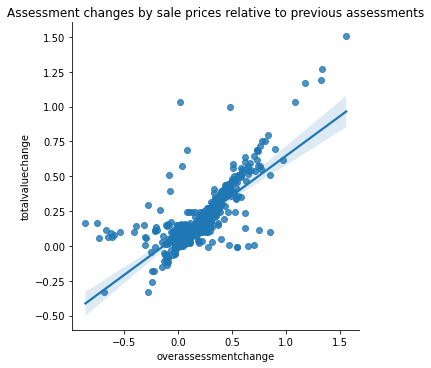

In [11]:
#collapse-hide
assessments_by_sale_category_by_parcel = bq.query(
    """
    with assessments as (
        select
            details.parcelnumb as parcelnumber,
            details.geoparceli as gpin,
            assessments.taxyear,
            assessments.totalvalue,
            lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear) as totalvalueprev,
            safe_divide(
                assessments.totalvalue - lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear),
                lag(assessments.totalvalue, 1) over (partition by details.parcelnumb order by assessments.taxyear)
            ) as totalvaluechange,
        from `cvilledata.cville_open_data.parcel_area_details` details
        join `cvilledata.cville_open_data.real_estate_all_assessments` assessments on details.parcelnumb = assessments.parcelnumb
    ), sales as (
        select
            *,
            count(*) over (partition by bookpage) as parcelcount,
        from `cvilledata.cville_open_data.real_estate_sales`
    )
    select
        assessments.parcelnumber,
        neighborhoods.name as neighborhoodname,
        concat(details.streetnumb, ' ', details.streetname) as address,
        assessments.totalvaluechange as totalvaluechange,
        safe_divide(sales.saleamount - assessments.totalvalueprev, assessments.totalvalueprev) as overassessmentchange,
    from assessments
    join `cvilledata.cville_open_data.parcel_area_details` details on assessments.parcelnumber = details.parcelnumb
    join `cvilledata.cville_open_data.real_estate_residential_details` residential on assessments.parcelnumber = residential.parcelnumb
    join `cvilledata.cville_open_data_derived.geopin_to_assessment_neighborhood` neighborhoods on assessments.gpin = neighborhoods.gpin
    left join sales on assessments.parcelnumber = sales.parcelnumb and sales.saleamount > 0 and sales.parcelcount = 1 and extract(year from sales.saledate) = assessments.taxyear - 1
    where assessments.taxyear = 2022
        and residential.yearbuilt < 2002
        and sales.saleamount is not null
    """
).result().to_dataframe()

sns.lmplot(
    data=assessments_by_sale_category_by_parcel,
    x="overassessmentchange",
    y="totalvaluechange",
).set(
    title="Assessment changes by sale prices relative to previous assessments",
)

Unsurprisingly, houses that sold relatively high over their previous assessment also saw relatively large increases in assessed value the following year. However, the slope of the best-fit line is about 0.57, meaning that a parcel that sold for 10% more than its previous assessment saw its assessed value rise by about 0.057%. In other words, even though new homeowners are likely to experience relatively large increases in home assessments, those assessments may still fall short of the price they actually paid.

In [12]:
#collapse-hide
model = smf.ols(formula="totalvaluechange ~ overassessmentchange", data=assessments_by_sale_category_by_parcel)
res = model.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       totalvaluechange   R-squared:                       0.586
Model:                            OLS   Adj. R-squared:                  0.585
Method:                 Least Squares   F-statistic:                     870.2
Date:                Tue, 19 Apr 2022   Prob (F-statistic):          7.50e-120
Time:                        01:20:36   Log-Likelihood:                 411.06
No. Observations:                 617   AIC:                            -818.1
Df Residuals:                     615   BIC:                            -809.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.0780      0.006     12.649      0.000       0.066       0.090
overassessmentchange     0.5703      0.019     29.500      0.000       0.532       0.608
==============================================================================
Omnibus:                      301.351   Durbin-Watson:                   1.660
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3352.080
Skew:                           1.885   Prob(JB):                         0.00
Kurtosis:                      13.779   Cond. No.                         4.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Our simple model explains future assessment changes fairly well, accounting for about 59% of the variance in assessment changes for parcels that sold the previous year. However, there are some outliers from the best fit line; we can draw an interactive plot (hover over points for details) and color points by neighborhood to look for an explanation, although nothing jumps out at me:

In [13]:
#collapse-hide
alt.Chart(assessments_by_sale_category_by_parcel).mark_circle(size=60).encode(
    y=alt.Y("totalvaluechange:Q"),
    x=alt.X("overassessmentchange:Q"),
    color=alt.Color("neighborhoodname:N"),
    tooltip=["address:N", "overassessmentchange:Q", "totalvaluechange:Q"],
).properties(
    title="Assessment changes by sale prices relative to previous assessments",
).interactive()

alt.Chart(...)

Well, this was fun! My main takeaway is something like "assessments are confusing", but here are a few more specific observations:

- The increase in assessments in 2022 is high relative to the past few years, but we aren't replaying 2007 yet.
- Changes in assessments are mostly consistent within neighborhoods. For most neighborhoods, the assessor seems to adjust assessments on most properties by roughly the same proportion. Except...
- Properties that sold during the previous year, and especially properties that sold for more than their previous assessments, increased in value much more than nearby properties.
- Some parcels had identical values across two or more years, and sometimes values remained the same for most of a neighborhood.

Did I miss anything? Find a mistake in a query? Let me know [@whatthecarp](https://twitter.com/whatthecarp).